In [ ]:
!pip install optuna

In [ ]:
#data processing
import matplotlib.pyplot as plt
from pandas import DataFrame, concat
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dropout, Attention, MultiHeadAttention, Flatten
from tensorflow.keras.layers import Dropout, Dense, LSTM, Bidirectional, Attention, SimpleRNN, GRU
from tensorflow import keras
from tensorflow.keras.utils import plot_model
import optuna
import numpy as np
from numpy import concatenate
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from pylab import mpl
from datetime import datetime, timedelta
import seaborn as sns

import math
import os
import time
import gc
import pathlib

# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None

# to display the float values upto 6 decimal places
pd.options.display.float_format = '{:.6f}'.format


plt.rcParams['figure.figsize'] = (10, 7)


import seaborn as sns
sns.set_style('whitegrid')
# plt.style.use("fivethirtyeight")
%matplotlib inline

In [ ]:
def fillna_mean(df):
    for cols in list(df.columns[df.isnull().sum() > 0]):
        mean_val = df[cols].mean()
        df[cols].fillna(mean_val, inplace=True)
    return df


def fillna_back(df):
    df = df.fillna(axis=0, method="bfill", limit=None)
    return df

In [ ]:
# prepare data for lstm
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    """
     Frame a time series as a supervised learning dataset.
     Arguments:
     data: Sequence of observations as a list or NumPy array.
     n_in: Number of lag observations as input (X).
     n_out: Number of observations as output (y).
     dropnan: Boolean whether or not to drop rows with NaN values.
     Returns:
     Pandas DataFrame of series framed for supervised learning.
     """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg


In [ ]:
df_AQI=pd.read_csv('/content/dataset.csv')

In [ ]:
dataset = fillna_back(df_AQI)

In [ ]:
dataset.shape

(420768, 18)

In [ ]:
dataset.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.000000,4.000000,4.000000,7.000000,300.000000,77.000000,-0.700000,1023.000000,-18.800000,0.000000,NNW,4.400000,Aotizhongxin
1,2,2013,3,1,1,8.000000,8.000000,4.000000,7.000000,300.000000,77.000000,-1.100000,1023.200000,-18.200000,0.000000,N,4.700000,Aotizhongxin
2,3,2013,3,1,2,7.000000,7.000000,5.000000,10.000000,300.000000,73.000000,-1.100000,1023.500000,-18.200000,0.000000,NNW,5.600000,Aotizhongxin
3,4,2013,3,1,3,6.000000,6.000000,11.000000,11.000000,300.000000,72.000000,-1.400000,1024.500000,-19.400000,0.000000,NW,3.100000,Aotizhongxin
4,5,2013,3,1,4,3.000000,3.000000,12.000000,12.000000,300.000000,72.000000,-2.000000,1025.200000,-19.500000,0.000000,N,2.000000,Aotizhongxin


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       420768 non-null  int64  
 1   year     420768 non-null  int64  
 2   month    420768 non-null  int64  
 3   day      420768 non-null  int64  
 4   hour     420768 non-null  int64  
 5   PM2.5    420768 non-null  float64
 6   PM10     420768 non-null  float64
 7   SO2      420768 non-null  float64
 8   NO2      420768 non-null  float64
 9   CO       420768 non-null  float64
 10  O3       420768 non-null  float64
 11  TEMP     420768 non-null  float64
 12  PRES     420768 non-null  float64
 13  DEWP     420768 non-null  float64
 14  RAIN     420768 non-null  float64
 15  wd       420768 non-null  object 
 16  WSPM     420768 non-null  float64
 17  station  420768 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 57.8+ MB


In [ ]:
dataset.isna().sum()

No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64

In [ ]:
import datetime

In [ ]:
dataset.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000
mean,210384.500000,2014.662560,6.522930,15.729637,11.500000,79.529095,104.758154,15.892587,50.665607,1231.124563,57.032025,13.531582,1010.753173,2.482429,0.064421,1.730279
std,121465.403371,1.177198,3.448707,8.800102,6.922195,80.952015,92.536649,21.757203,35.413894,1161.131229,56.659905,11.437435,10.473998,13.797530,0.820627,1.247182
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.400000,-43.400000,0.000000,0.000000
25%,105192.750000,2014.000000,4.000000,8.000000,5.750000,20.000000,36.000000,3.000000,23.000000,500.000000,10.000000,3.100000,1002.300000,-8.900000,0.000000,0.900000
50%,210384.500000,2015.000000,7.000000,16.000000,11.500000,55.000000,82.000000,7.000000,43.000000,900.000000,44.000000,14.500000,1010.400000,3.000000,0.000000,1.400000
75%,315576.250000,2016.000000,10.000000,23.000000,17.250000,110.900000,145.000000,20.000000,71.000000,1500.000000,82.000000,23.225000,1019.000000,15.100000,0.000000,2.200000
max,420768.000000,2017.000000,12.000000,31.000000,23.000000,999.000000,999.000000,500.000000,290.000000,10000.000000,1071.000000,41.600000,1042.800000,29.100000,72.500000,13.200000


In [ ]:
#droping / imputing missing values
dataset['PM2.5'].fillna(dataset['PM2.5'].median(), inplace=True)
dataset['PM10'].fillna(dataset['PM10'].median(), inplace=True)
dataset['SO2'].fillna(dataset['SO2'].median(), inplace=True)
dataset['NO2'].fillna(dataset['NO2'].mean(), inplace=True)
dataset['CO'].fillna(dataset['CO'].median(), inplace=True)
dataset['O3'].fillna(dataset['O3'].median(), inplace=True)
dataset['TEMP'].fillna(dataset['TEMP'].median(), inplace=True)
dataset['PRES'].fillna(dataset['PRES'].median(), inplace=True)
dataset['DEWP'].fillna(dataset['DEWP'].median(), inplace=True)
dataset['RAIN'].fillna(dataset['RAIN'].median(), inplace=True)
dataset['WSPM'].fillna(dataset['WSPM'].median(), inplace=True)
dataset.dropna(subset = ['wd'], inplace=True)
dataset.drop(['No'], axis = 1, inplace = True)
dataset.shape

(420768, 17)

In [ ]:
dataset.station.value_counts()


Aotizhongxin        35064
Changping           35064
Dingling            35064
Dongsi              35064
Guanyuan            35064
Gucheng             35064
Huairou             35064
Nongzhanguanguan    35064
Shunyi              35064
Tiantan             35064
Wanliu              35064
Wanshouxigong       35064
Name: station, dtype: int64

In [ ]:
dataset.columns

Index(['year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO',
       'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')

In [ ]:
dataset.isnull().sum()

year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64

In [ ]:
#converting year,month, day, hour columns into datetime format
#and changing index into Date required for time series analysis
dataset['dateInt']=dataset['year'].astype(str) + dataset['month'].astype(str).str.zfill(2)+ dataset['day'].astype(str).str.zfill(2)+dataset['hour'].astype(str).str.zfill(2)
dataset['Date'] = pd.to_datetime(dataset['dateInt'], format='%Y%m%d%H')
dataset['dateInt']=dataset['year'].astype(str) + dataset['month'].astype(str).str.zfill(2)+ dataset['day'].astype(str).str.zfill(2)
dataset['date'] = pd.to_datetime(dataset['dateInt'], format='%Y%m%d')


In [ ]:
dataset.set_index('Date', inplace=True)
dataset.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
Date,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,3,1,0,4.000000,4.000000,4.000000,7.000000,300.000000,77.000000,-0.700000,1023.000000,-18.800000,0.000000,NNW,4.400000,Aotizhongxin,20130301,2013-03-01
2013-03-01 01:00:00,2013,3,1,1,8.000000,8.000000,4.000000,7.000000,300.000000,77.000000,-1.100000,1023.200000,-18.200000,0.000000,N,4.700000,Aotizhongxin,20130301,2013-03-01
2013-03-01 02:00:00,2013,3,1,2,7.000000,7.000000,5.000000,10.000000,300.000000,73.000000,-1.100000,1023.500000,-18.200000,0.000000,NNW,5.600000,Aotizhongxin,20130301,2013-03-01
2013-03-01 03:00:00,2013,3,1,3,6.000000,6.000000,11.000000,11.000000,300.000000,72.000000,-1.400000,1024.500000,-19.400000,0.000000,NW,3.100000,Aotizhongxin,20130301,2013-03-01
2013-03-01 04:00:00,2013,3,1,4,3.000000,3.000000,12.000000,12.000000,300.000000,72.000000,-2.000000,1025.200000,-19.500000,0.000000,N,2.000000,Aotizhongxin,20130301,2013-03-01


In [ ]:
cols_to_drop = ['year', 'month', 'day', 'hour','dateInt','station','wd']
df = dataset.drop(cols_to_drop, axis = 1)

In [ ]:
df.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,date
Date,,,,,,,,,,,,
2013-03-01 00:00:00,4.000000,4.000000,4.000000,7.000000,300.000000,77.000000,-0.700000,1023.000000,-18.800000,0.000000,4.400000,2013-03-01
2013-03-01 01:00:00,8.000000,8.000000,4.000000,7.000000,300.000000,77.000000,-1.100000,1023.200000,-18.200000,0.000000,4.700000,2013-03-01
2013-03-01 02:00:00,7.000000,7.000000,5.000000,10.000000,300.000000,73.000000,-1.100000,1023.500000,-18.200000,0.000000,5.600000,2013-03-01
2013-03-01 03:00:00,6.000000,6.000000,11.000000,11.000000,300.000000,72.000000,-1.400000,1024.500000,-19.400000,0.000000,3.100000,2013-03-01
2013-03-01 04:00:00,3.000000,3.000000,12.000000,12.000000,300.000000,72.000000,-2.000000,1025.200000,-19.500000,0.000000,2.000000,2013-03-01


In [ ]:
df.columns

Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'WSPM', 'date'],
      dtype='object')

In [ ]:
df1= df.drop('date', axis = 1)
df1.columns

Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'WSPM'],
      dtype='object')

In [ ]:
#Remove outliers from the data set
#not standard approach
print('Before: Outliers Treating with IQR', dataset.shape)
df_outlier = df1.copy()

df_outlier  = df_outlier.select_dtypes(exclude ='object')
#1st quantile
q1 = df_outlier.quantile(0.25)

#3rd quantile
q3 = df_outlier.quantile(0.75)

# IQR: The Interquartile Range is defined as the difference between the third and first quartile
# calculate IQR for each numeric variable
iqr = q3-q1
# print(IQR)
# retrieve the dataframe without the outliers
# '~' returns the values that do not satisfy the given conditions
# i.e. it returns values between the range [Q1-1.5*IQR, Q3+1.5*IQR]
# '|' is used as 'OR' operator on multiple conditions
# 'any(axis=1)' checks the entire row for atleast one 'True' entry (those rows represents outliers in the data)
df_outlier = df_outlier[~((df_outlier  < (q1-(1.5*iqr))) | (df_outlier  > (q3+(1.5*iqr)))).any(axis=1)]

# check the shape of the data
print('After: Outliers Treating with IQR', df_outlier.shape)


Before: Outliers Treating with IQR (420768, 19)
After: Outliers Treating with IQR (305957, 11)


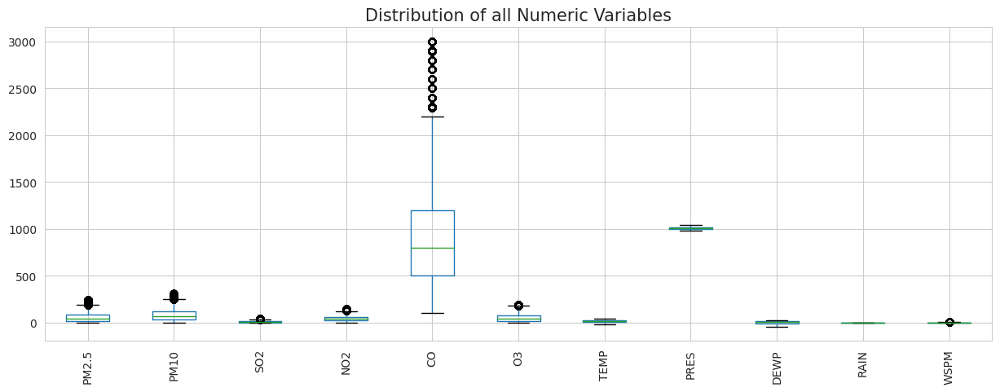

In [ ]:
df_outlier = df_outlier.select_dtypes(exclude='object').copy()
plt.figure(figsize = (15,5))

# plot a boxplot to visualize the outliers in all the numeric variables
df_outlier.boxplot()

# set plot label
# set text size using 'fontsize'
plt.title('Distribution of all Numeric Variables', fontsize = 15)

# xticks() returns the x-axis ticks
# 'rotation = vertical' rotates the x-axis labels vertically
plt.xticks(rotation = 'vertical', fontsize = 10)

# display the plot
plt.show()

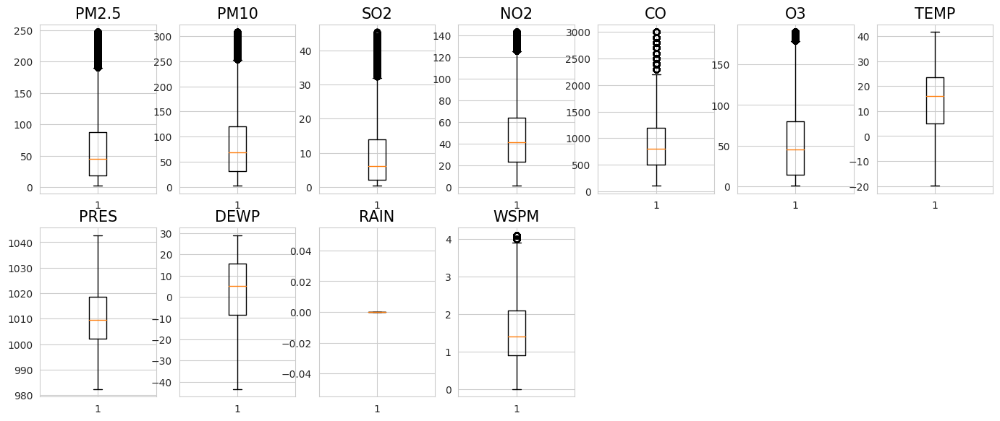

In [ ]:
# df_comp = df_comp.select_dtypes(exclude='object').copy()
plt.rcParams['figure.dpi'] = 100
df_out=df_outlier.copy()
outliers_by_variables = df_out.columns

plt.figure(figsize=(17,14))
for i in range(0,outliers_by_variables.shape[0]):
    plt.subplot(4,7, i+1)
    plt.boxplot(df_out[outliers_by_variables[i]], autorange=True)
    plt.title(outliers_by_variables[i], fontdict= {'fontsize': 15 ,'fontweight': 5, 'color':'000000'})
    plt.AutoLocator.default_params


In [ ]:
values = df_outlier.values
values = values.astype('float32')
scaler = MinMaxScaler()
scaled = scaler.fit_transform(values)
# frame as supervised learning
reframed = series_to_supervised(scaled, 3, 1)


In [ ]:
# split into train sets、validation sets and test sets
values = reframed.values
number=len(values)
n_train_hours = int(number*0.7)
n_valid_hours = int(number*0.9)
train = values[:n_train_hours, :]
valid = values[n_train_hours:n_valid_hours, :]
test = values[n_valid_hours:, :]
# split into input and outputs
train_X, train_y = train[:, :-11], train[:, -11:-5]
valid_X, valid_y = valid[:, :-11], valid[:, -11:-5]
test_X, test_y = test[:, :-11], test[:, -11:-5]
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
valid_X = valid_X.reshape((valid_X.shape[0], 1, valid_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, valid_X.shape, valid_y.shape, test_X.shape,
      test_y.shape)  # [samples, timesteps, features]

(214167, 1, 33) (214167, 6) (61191, 1, 33) (61191, 6) (30596, 1, 33) (30596, 6)


In [ ]:
titles = [
    "PM2.5",
    "PM10",
    "SO2",
    "NO2",
    "CO",
    "O3",
     "TEM",
    "PRES",
    "DEMP",
    "RAIN",
    "WSPM",
]

feature_keys = [
    "PM2.5",
    "PM10",
    "SO2",
    "NO2",
    "CO",
    "O3",
     "TEM",
    "PRES",
    "DEMP",
    "RAIN",
    "WSPM",

]

colors = [
    "blue",
    "orange",
    "green",
    "red",
    "brown",
    "cyan",
    "gray",
    "olive",
    "purple",
    "pink",
    "gold",

]

In [ ]:
def visualize_loss(history, title):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(len(loss))
    plt.figure(dpi=300)
    plt.plot(epochs, loss,"green", label="Training loss")
    plt.plot(epochs, val_loss,color="purple", label="Validation loss")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()


def visualize_acc(history, title):
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    epochs = range(len(acc))
    plt.figure(dpi=300)
    plt.plot(epochs, acc, "b", label="Training accuracy")
    plt.plot(epochs, val_acc, "r", label="Validation accuracy")
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("accuracy")
    plt.legend()
    plt.show()


In [ ]:
def compare_visual(data1, data2):
    fig, axes = plt.subplots(
        nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
    )
    for i in range(len(feature_keys)-5):
        key = feature_keys[i]
        ax = data1[key].plot(
            ax=axes[i // 3, i % 3],
            title="{}".format(titles[i]),
            rot=25,
            label="actual"
        )
        ax = data2[key].plot(
            ax=axes[i // 3, i % 3],
            color='red',
            rot=25,
            label='prediction'
        )
        ax.legend()
    plt.tight_layout()

    # scaler.inverse_transform()


def inv_scale(df, y):
    max = df.max()[-11:-5]
    min = df.min()[-11:-5]
#     df*(max-min)+min
    yy=y.copy()
    for i in range(len(yy)):
        yy[i] = yy[i]*(max-min)+min
    return yy


In [ ]:
def evaluate(model):
    # make a prediction
    yhat = model.predict(test_X)
    # move return_sequences=True
#     inv_yhat = scaler.inverse_transform(yhat)
    # invert scaling for actual
#     inv_y = scaler.inverse_transform(test_y)
    inv_yhat=inv_scale(dataset,yhat)
    inv_y=inv_scale(dataset,test_y)

    # calculate RMSE
#     aqi_inv_y = inv_y[:, -6:]
#     aqi_inv_yhat = inv_yhat[:, -6:]
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)
    mae = mean_absolute_error(inv_y, inv_yhat)
    print('Test MAE: %.3f' % mae)
    R2=r2_score(inv_y, inv_yhat)
    print('Test R2: %.3f' % R2)
    y1 = DataFrame(
        inv_y[-100:], index=dataset.index[-100:], columns=dataset.columns[-11:-5])
    y2 = DataFrame(
        inv_yhat[-100:], index=dataset.index[-100:], columns=dataset.columns[-11:-5])
    compare_visual(y1,y2)

In [ ]:
epochs = 100
batch_size = 32
learning_rate = 0.001

timesteps = train_X.shape[1]
input_dim = train_X.shape[2]
output_dim=6


Epoch 1/100
6693/6693 [==============================] - 26s 4ms/step - loss: 0.0219 - accuracy: 0.6288 - val_loss: 0.0070 - val_accuracy: 0.7979
Epoch 2/100
6693/6693 [==============================] - 24s 4ms/step - loss: 0.0066 - accuracy: 0.8033 - val_loss: 0.0071 - val_accuracy: 0.7972
Epoch 3/100
6693/6693 [==============================] - 23s 3ms/step - loss: 0.0065 - accuracy: 0.8051 - val_loss: 0.0071 - val_accuracy: 0.7927
Epoch 4/100
6693/6693 [==============================] - 21s 3ms/step - loss: 0.0064 - accuracy: 0.8066 - val_loss: 0.0068 - val_accuracy: 0.7978
Epoch 5/100
6693/6693 [==============================] - 22s 3ms/step - loss: 0.0064 - accuracy: 0.8072 - val_loss: 0.0068 - val_accuracy: 0.7982
Epoch 6/100
6693/6693 [==============================] - 23s 3ms/step - loss: 0.0063 - accuracy: 0.8081 - val_loss: 0.0068 - val_accuracy: 0.7995
Epoch 7/100
6693/6693 [==============================] - 23s 3ms/step - loss: 0.0063 - accuracy: 0.8082 - val_loss: 0.0067 -

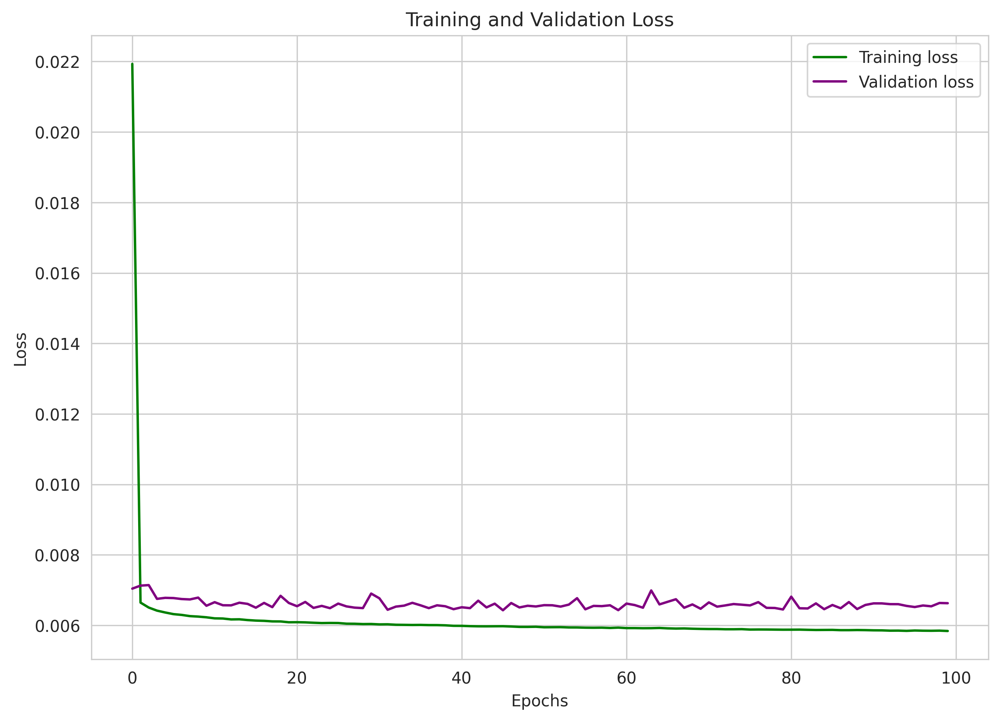

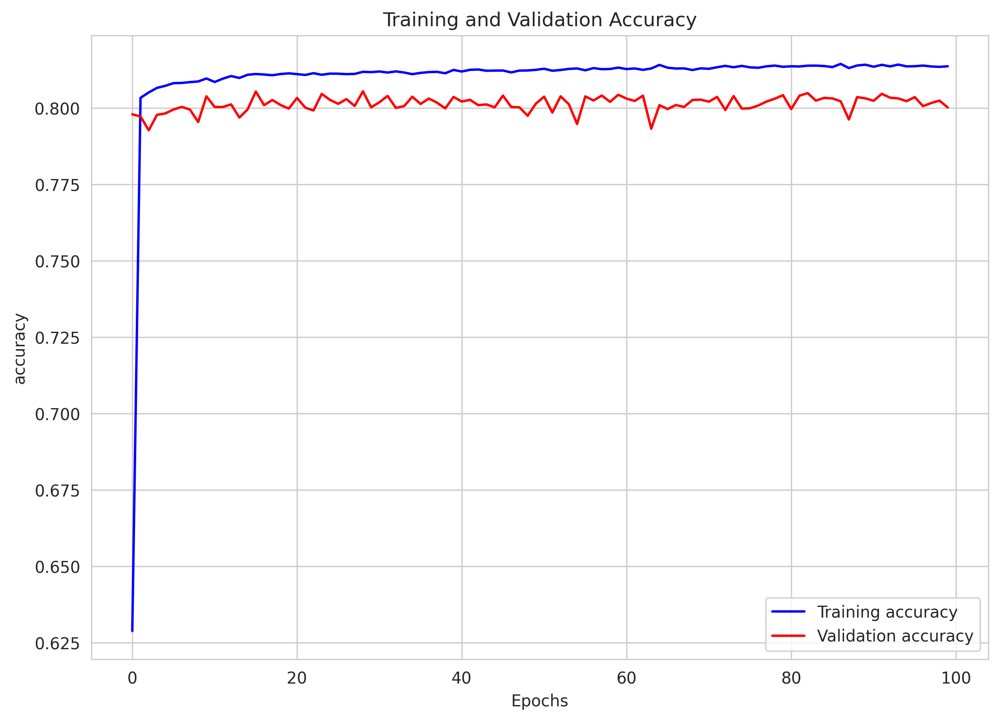

In [ ]:
inputs = Input(shape=(timesteps, input_dim))
rnn_out = SimpleRNN(128,activation='relu',return_sequences = False)(inputs)

dense = Dense(units=128, activation='relu')(rnn_out)

output = Dense(units=output_dim, activation='relu')(dense)

rnn = Model(inputs=inputs,  outputs=output)


rnn.compile(loss='mse', optimizer=keras.optimizers.Adam(
    learning_rate=learning_rate), metrics=['accuracy'])

# plot_model(model, to_file="Bi-LSTM-MultiheadAtt.png",
#            dpi=300, show_shapes=True)

path_checkpoint = "model_checkpoint_MultiAttLSTM_aqiPre.h5"
es_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss", min_delta=0,
    patience=10
)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=0,
    save_weights_only=True,
    save_best_only=True,
)

# fit network
history = rnn.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(valid_X, valid_y),
#                     callbacks=[es_callback, modelckpt_callback]
                    )
visualize_loss(history, "Training and Validation Loss")
visualize_acc(history, "Training and Validation Accuracy")


Epoch 1/100
6693/6693 [==============================] - 34s 5ms/step - loss: 0.0075 - accuracy: 0.7916 - val_loss: 0.0071 - val_accuracy: 0.7891
Epoch 2/100
6693/6693 [==============================] - 31s 5ms/step - loss: 0.0066 - accuracy: 0.8035 - val_loss: 0.0069 - val_accuracy: 0.7953
Epoch 3/100
6693/6693 [==============================] - 33s 5ms/step - loss: 0.0065 - accuracy: 0.8054 - val_loss: 0.0068 - val_accuracy: 0.7972
Epoch 4/100
6693/6693 [==============================] - 31s 5ms/step - loss: 0.0064 - accuracy: 0.8065 - val_loss: 0.0068 - val_accuracy: 0.7998
Epoch 5/100
6693/6693 [==============================] - 34s 5ms/step - loss: 0.0063 - accuracy: 0.8076 - val_loss: 0.0067 - val_accuracy: 0.7986
Epoch 6/100
6693/6693 [==============================] - 33s 5ms/step - loss: 0.0063 - accuracy: 0.8080 - val_loss: 0.0067 - val_accuracy: 0.7981
Epoch 7/100
6693/6693 [==============================] - 34s 5ms/step - loss: 0.0062 - accuracy: 0.8091 - val_loss: 0.0069 -

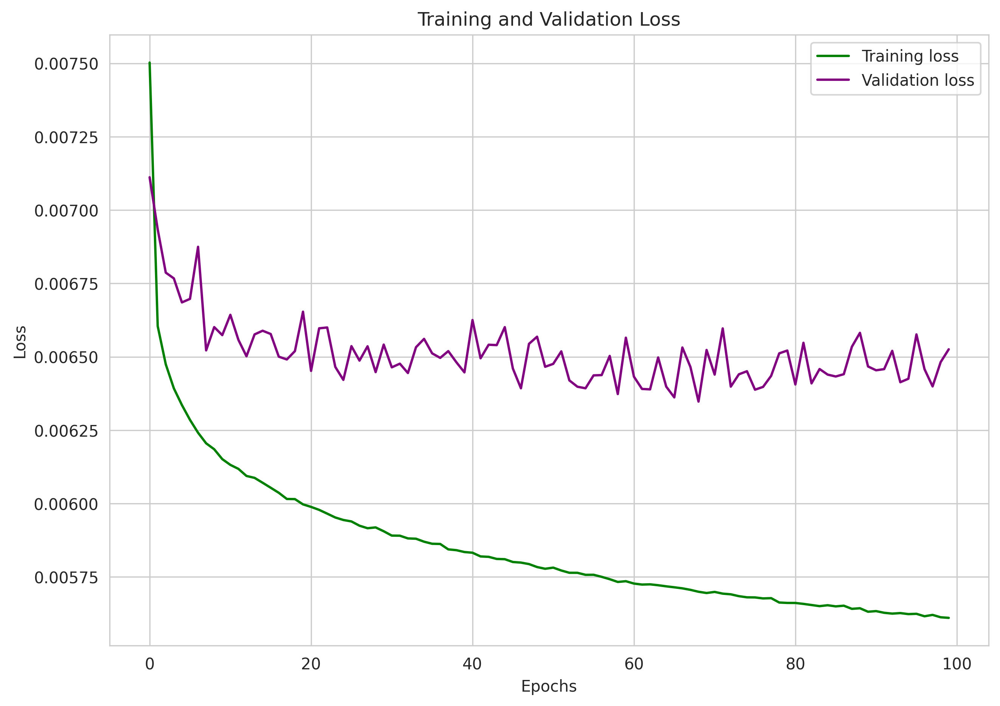

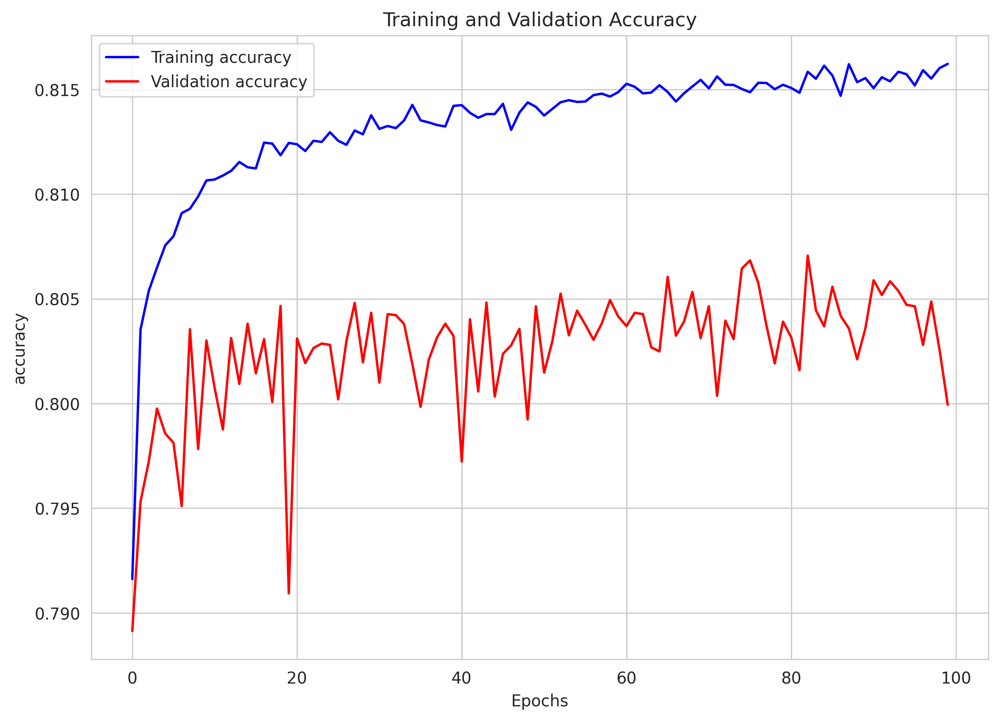

In [ ]:
inputs = Input(shape=(timesteps, input_dim))
gru_out = GRU(128, activation='relu', return_sequences=False)(inputs)


dense = Dense(units=128, activation='relu')(gru_out)

output = Dense(units=output_dim, activation='relu')(dense)

gru = Model(inputs=inputs,  outputs=output)


gru.compile(loss='mse', optimizer=keras.optimizers.Adam(
    learning_rate=learning_rate), metrics=['accuracy'])

# plot_model(model, to_file="Bi-LSTM-MultiheadAtt.png",
#            dpi=300, show_shapes=True)

path_checkpoint = "model_checkpoint_MultiAttLSTM_aqiPre.h5"
es_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss", min_delta=0,
    patience=10
)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=0,
    save_weights_only=True,
    save_best_only=True,
)

# fit network
history = gru.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(valid_X, valid_y),
#                     callbacks=[es_callback, modelckpt_callback]
                    )
visualize_loss(history, "Training and Validation Loss")
visualize_acc(history, "Training and Validation Accuracy")

# evaluate(model)

Epoch 1/100
6693/6693 [==============================] - 40s 6ms/step - loss: 0.0079 - accuracy: 0.7890 - val_loss: 0.0074 - val_accuracy: 0.7868
Epoch 2/100
6693/6693 [==============================] - 40s 6ms/step - loss: 0.0066 - accuracy: 0.8034 - val_loss: 0.0070 - val_accuracy: 0.7930
Epoch 3/100
6693/6693 [==============================] - 39s 6ms/step - loss: 0.0065 - accuracy: 0.8061 - val_loss: 0.0068 - val_accuracy: 0.7938
Epoch 4/100
6693/6693 [==============================] - 40s 6ms/step - loss: 0.0064 - accuracy: 0.8065 - val_loss: 0.0068 - val_accuracy: 0.7996
Epoch 5/100
6693/6693 [==============================] - 39s 6ms/step - loss: 0.0063 - accuracy: 0.8079 - val_loss: 0.0068 - val_accuracy: 0.7958
Epoch 6/100
6693/6693 [==============================] - 38s 6ms/step - loss: 0.0063 - accuracy: 0.8077 - val_loss: 0.0066 - val_accuracy: 0.8011
Epoch 7/100
6693/6693 [==============================] - 39s 6ms/step - loss: 0.0063 - accuracy: 0.8092 - val_loss: 0.0070 -

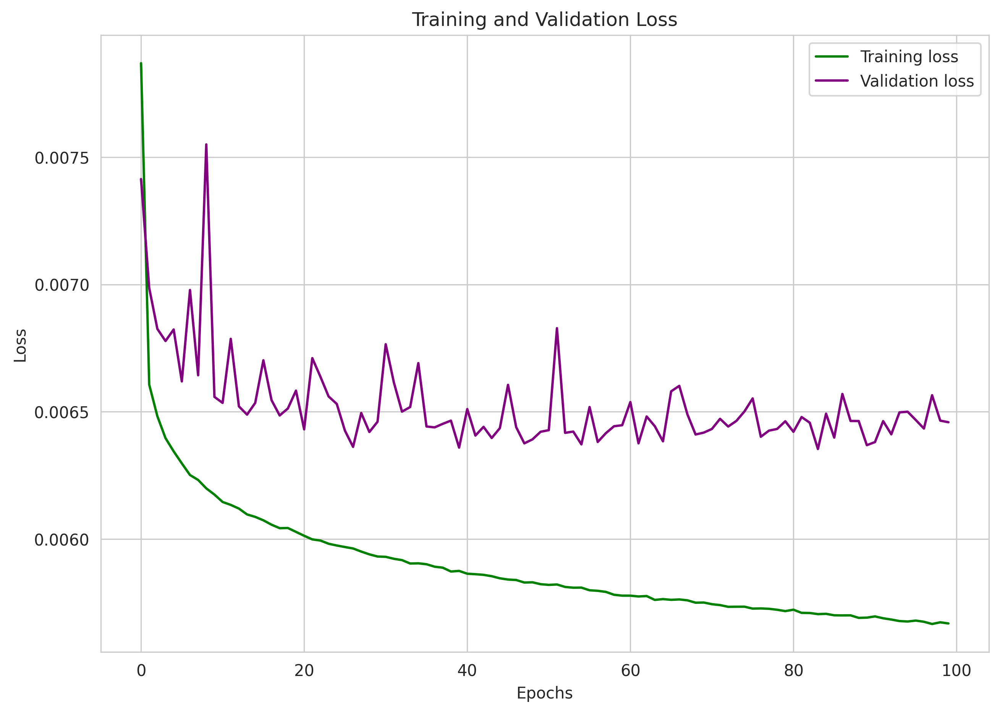

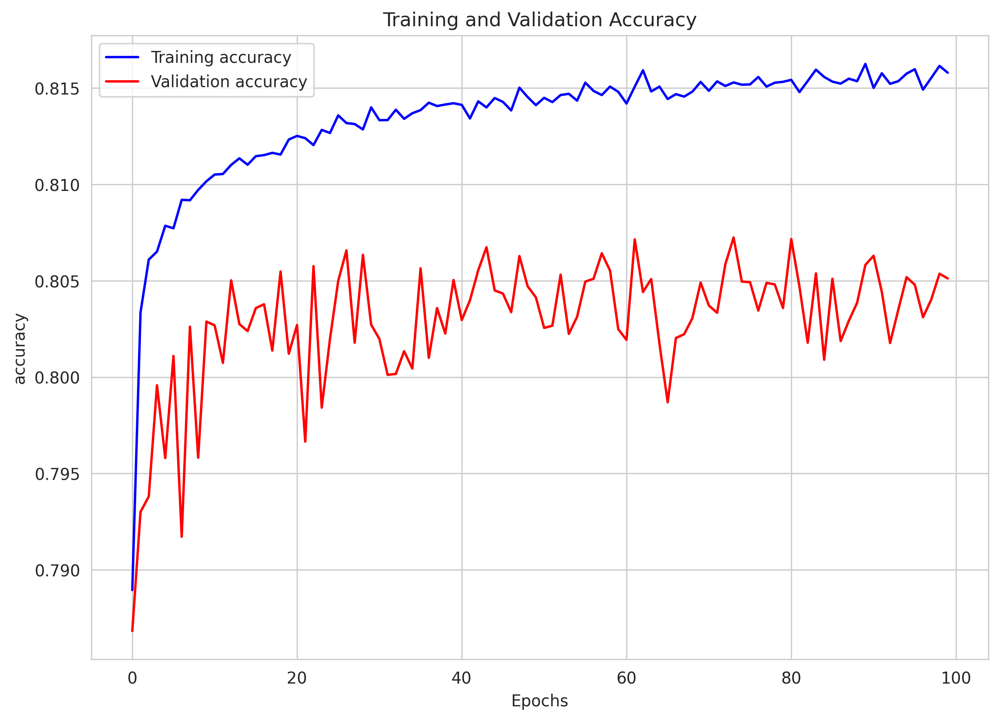

In [ ]:
inputs = Input(shape=(timesteps, input_dim))

lstm_out = LSTM(128, activation='relu', return_sequences=False)(inputs)
dense = Dense(units=128, activation='relu')(lstm_out)

output = Dense(units=output_dim, activation='relu')(dense)

lstm = Model(inputs=inputs,  outputs=output)


lstm.compile(loss='mse', optimizer=keras.optimizers.Adam(
    learning_rate=learning_rate), metrics=['accuracy'])

# plot_model(model, to_file="Bi-LSTM-MultiheadAtt.png",
#            dpi=300, show_shapes=True)

path_checkpoint = "model_checkpoint_MultiAttLSTM_aqiPre.h5"
es_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss", min_delta=0,
    patience=10
)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=0,
    save_weights_only=True,
    save_best_only=True,
)

# fit network
history = lstm.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(valid_X, valid_y),
#                     callbacks=[es_callback, modelckpt_callback]
                    )
visualize_loss(history, "Training and Validation Loss")
visualize_acc(history, "Training and Validation Accuracy")

# evaluate(model)

Epoch 1/100
6693/6693 [==============================] - 91s 13ms/step - loss: 0.0077 - accuracy: 0.7852 - val_loss: 0.0074 - val_accuracy: 0.7837
Epoch 2/100
6693/6693 [==============================] - 89s 13ms/step - loss: 0.0068 - accuracy: 0.7997 - val_loss: 0.0074 - val_accuracy: 0.7944
Epoch 3/100
6693/6693 [==============================] - 85s 13ms/step - loss: 0.0067 - accuracy: 0.8025 - val_loss: 0.0069 - val_accuracy: 0.7981
Epoch 4/100
6693/6693 [==============================] - 89s 13ms/step - loss: 0.0065 - accuracy: 0.8040 - val_loss: 0.0071 - val_accuracy: 0.7807
Epoch 5/100
6693/6693 [==============================] - 84s 13ms/step - loss: 0.0065 - accuracy: 0.8048 - val_loss: 0.0069 - val_accuracy: 0.7976
Epoch 6/100
6693/6693 [==============================] - 88s 13ms/step - loss: 0.0064 - accuracy: 0.8058 - val_loss: 0.0073 - val_accuracy: 0.7897
Epoch 7/100
6693/6693 [==============================] - 83s 12ms/step - loss: 0.0064 - accuracy: 0.8066 - val_loss: 0

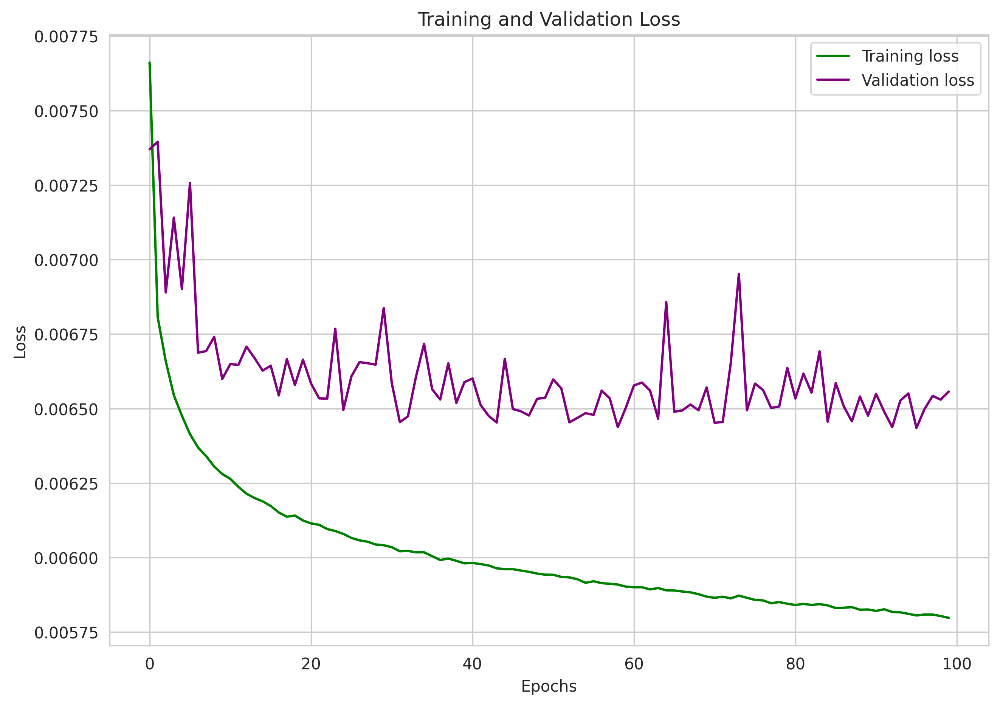

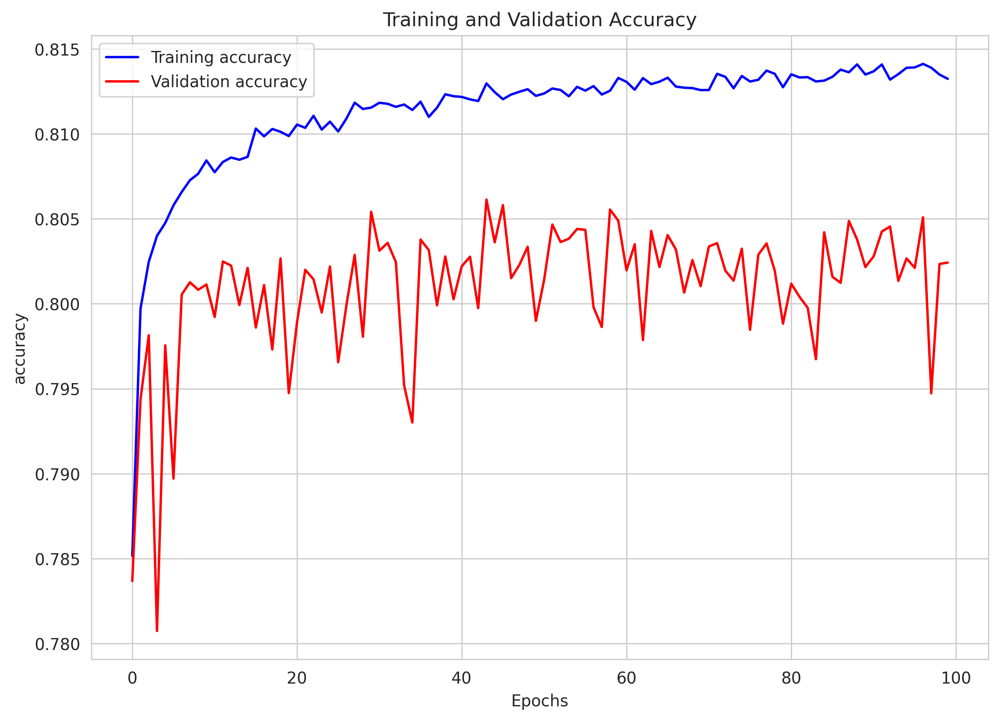

In [ ]:

inputs = Input(shape=(timesteps, input_dim))

lstm_out = Bidirectional(
    LSTM(units=128, activation='relu', return_sequences=True))(inputs)
multihead_attn = MultiHeadAttention(
    num_heads=4, key_dim=32)(lstm_out, lstm_out)

flatten = Flatten()(multihead_attn)
dense = Dense(units=128, activation='relu')(flatten)

output = Dense(units=output_dim, activation='relu')(dense)

BiLSTMultiheadAtt = Model(inputs=inputs,  outputs=output)


BiLSTMultiheadAtt.compile(loss='mse', optimizer=keras.optimizers.Adam(
    learning_rate=learning_rate), metrics=['accuracy'])

# plot_model(model, to_file="Bi-LSTM-MultiheadAtt.png",
#            dpi=300, show_shapes=True)

path_checkpoint = "model_checkpoint_MultiAttLSTM_aqiPre.h5"
es_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss", min_delta=0,
    patience=10
)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=0,
    save_weights_only=True,
    save_best_only=True,
)

# fit network
history = BiLSTMultiheadAtt.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(valid_X, valid_y),
#                     callbacks=[es_callback, modelckpt_callback]
                    )
visualize_loss(history, "Training and Validation Loss")
visualize_acc(history, "Training and Validation Accuracy")

# evaluate(model)

In [ ]:
def inv_scale(df, y):
    max = df.max()[-11:-5]
    min = df.min()[-11:-5]
#     df*(max-min)+min
    yy=y.copy()
    for i in range(len(yy)):
        yy[i] = yy[i]*(max-min)+min  # 25	15	3	7	4	25
    return yy


models = ["RNN", "GRU", "LSTM", "Bi-LSTM-MultiheadAtt"]

def transdata(model,i):
    yhat=model.predict(test_X)
    inv_yhat=inv_scale(dataset,yhat)
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    mae = mean_absolute_error(inv_y, inv_yhat)
    R2=r2_score(inv_y, inv_yhat)
    print('%s Test RMSE: %.3f' % (models[i],rmse))
    print('%s Test MAE: %.3f' % (models[i],mae))
    print('%s Test R2: %.3f' % (models[i],R2))
    data = DataFrame(
    inv_yhat[-100:], index=dataset.index[-100:], columns=dataset.columns[-11:-5])
    return data

In [ ]:
dataset=df_outlier
inv_y = inv_scale(dataset, test_y)
y = DataFrame(
    inv_y[-100:], index=dataset.index[-100:], columns=dataset.columns[-11:-5])

y1 = transdata(rnn, 0)
y2 = transdata(gru, 1)
y3 = transdata(lstm, 2)
y4 = transdata(BiLSTMultiheadAtt, 3)


957/957 [==============================] - 2s 2ms/step
RNN Test RMSE: 102.433
RNN Test MAE: 32.139
RNN Test R2: 0.856
957/957 [==============================] - 3s 2ms/step
GRU Test RMSE: 101.393
GRU Test MAE: 31.690
GRU Test R2: 0.858
957/957 [==============================] - 3s 2ms/step
LSTM Test RMSE: 102.745
LSTM Test MAE: 31.978
LSTM Test R2: 0.859
957/957 [==============================] - 4s 4ms/step
Bi-LSTM-MultiheadAtt Test RMSE: 101.788
Bi-LSTM-MultiheadAtt Test MAE: 31.605
Bi-LSTM-MultiheadAtt Test R2: 0.858


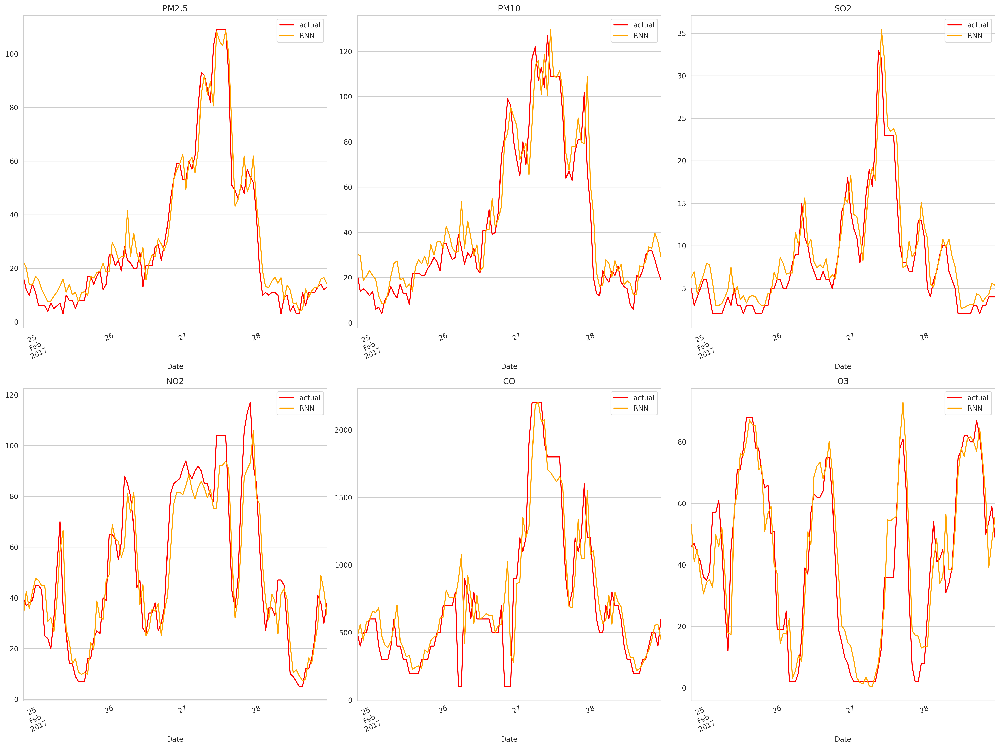

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    key = feature_keys[i]
    ax = y[key].plot(
        ax=axes[i // 3, i % 3],
        color='red',
        title="{}".format(titles[i]),
        rot=25,
        label="actual"
    )
    ax = y1[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='RNN'
    )
    ax.legend()
plt.tight_layout()


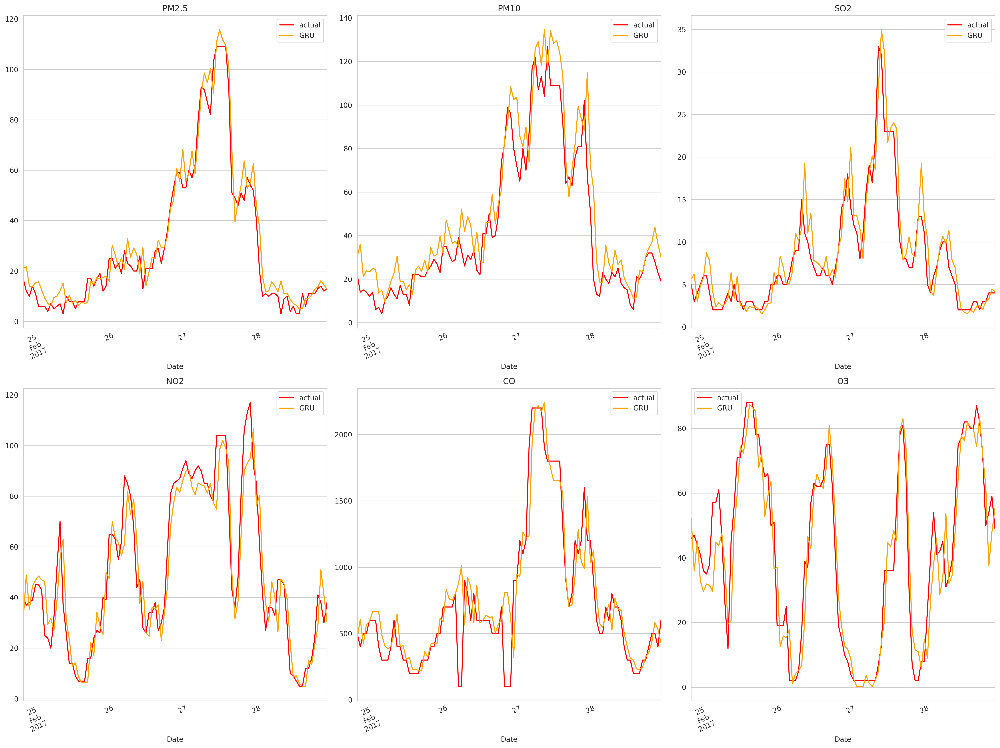

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    key = feature_keys[i]
    ax = y[key].plot(
        ax=axes[i // 3, i % 3],
        color='red',
        title="{}".format(titles[i]),
        rot=25,
        label="actual"
    )
    ax = y2[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='GRU'
    )
    ax.legend()
plt.tight_layout()


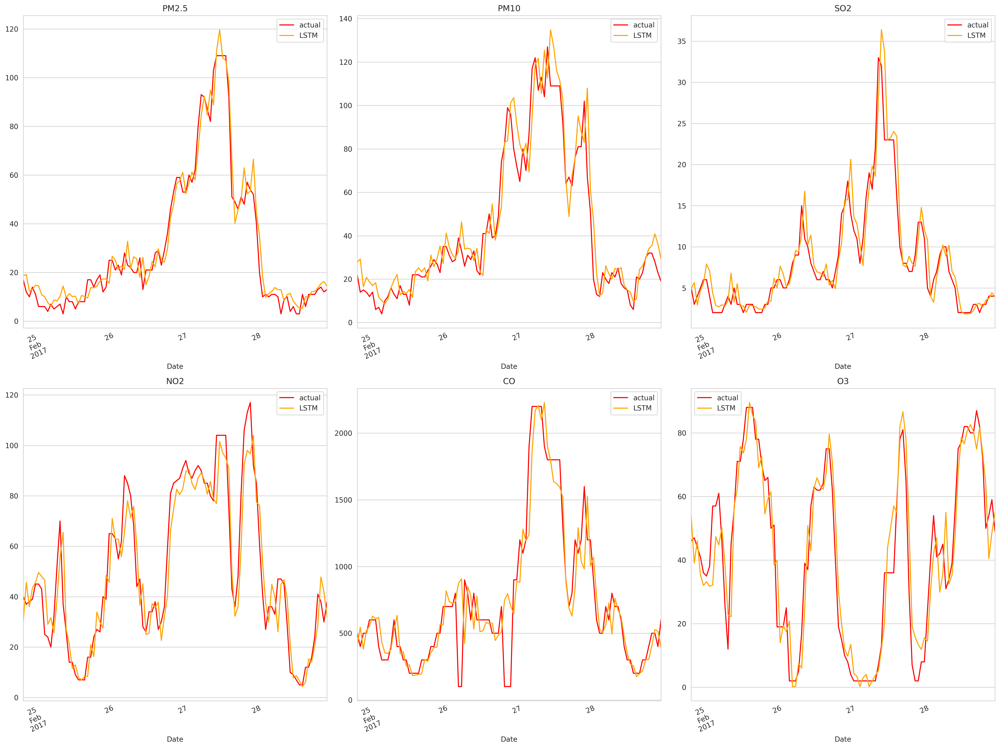

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    key = feature_keys[i]
    ax = y[key].plot(
        ax=axes[i // 3, i % 3],
        color='red',
        title="{}".format(titles[i]),
        rot=25,
        label="actual"
    )
    ax = y3[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='LSTM'
    )
    ax.legend()
plt.tight_layout()


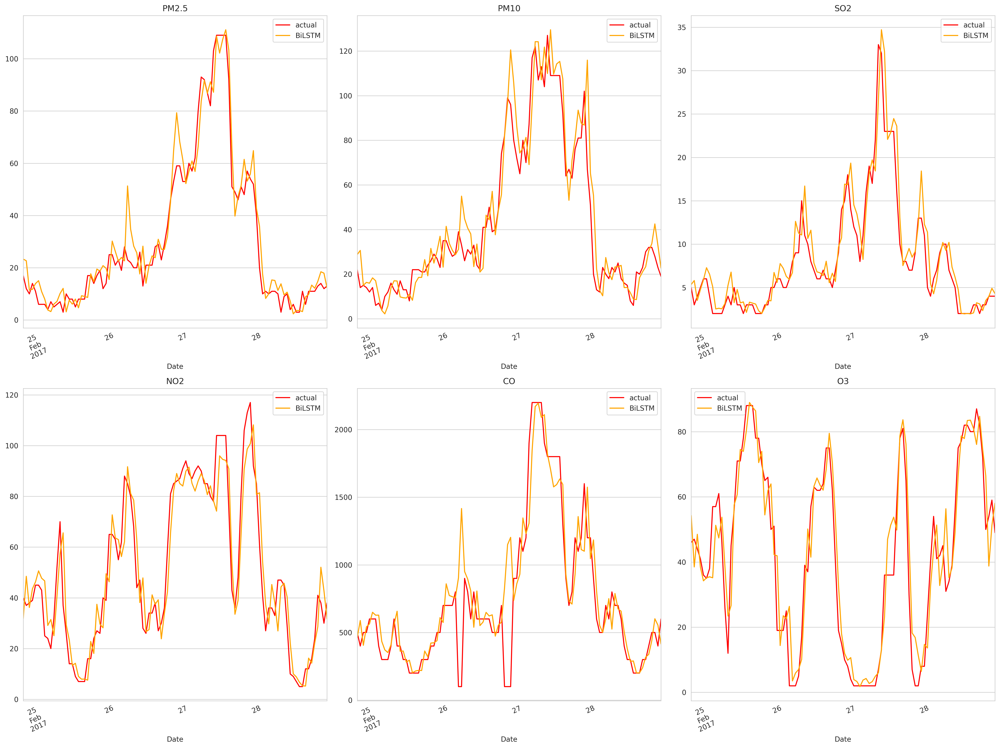

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    key = feature_keys[i]
    ax = y[key].plot(
        ax=axes[i // 3, i % 3],
        color='red',
        title="{}".format(titles[i]),
        rot=25,
        label="actual"
    )
    ax = y4[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='BiLSTM'
    )
    ax.legend()
plt.tight_layout()


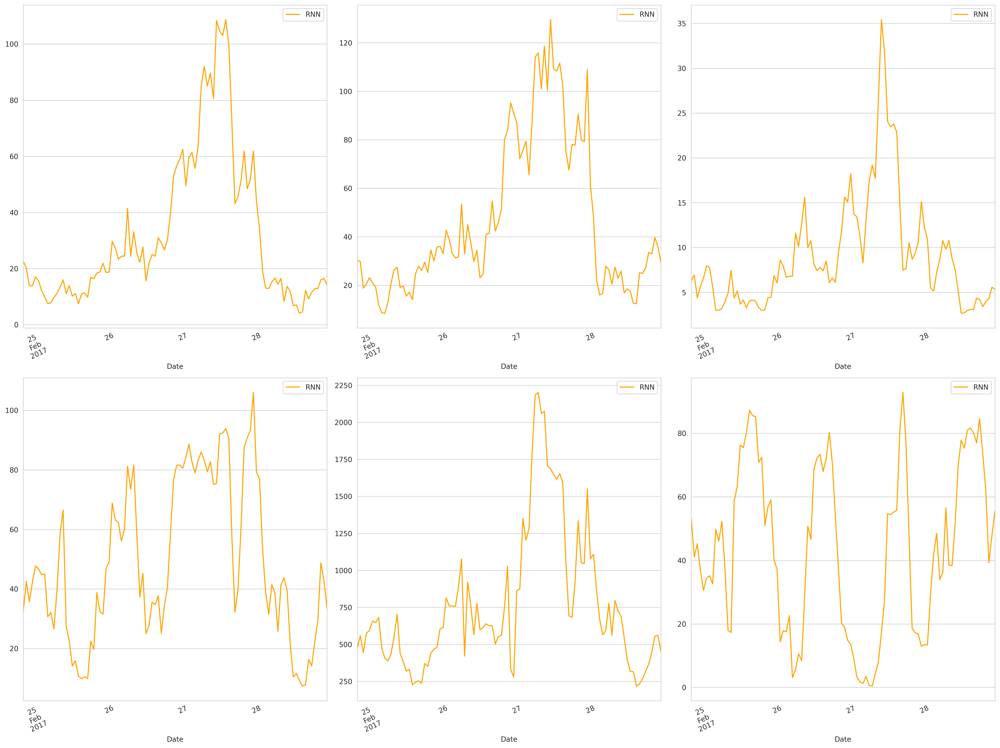

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    key = feature_keys[i]
    ax = y1[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='RNN'
    )
    ax.legend()
plt.tight_layout()


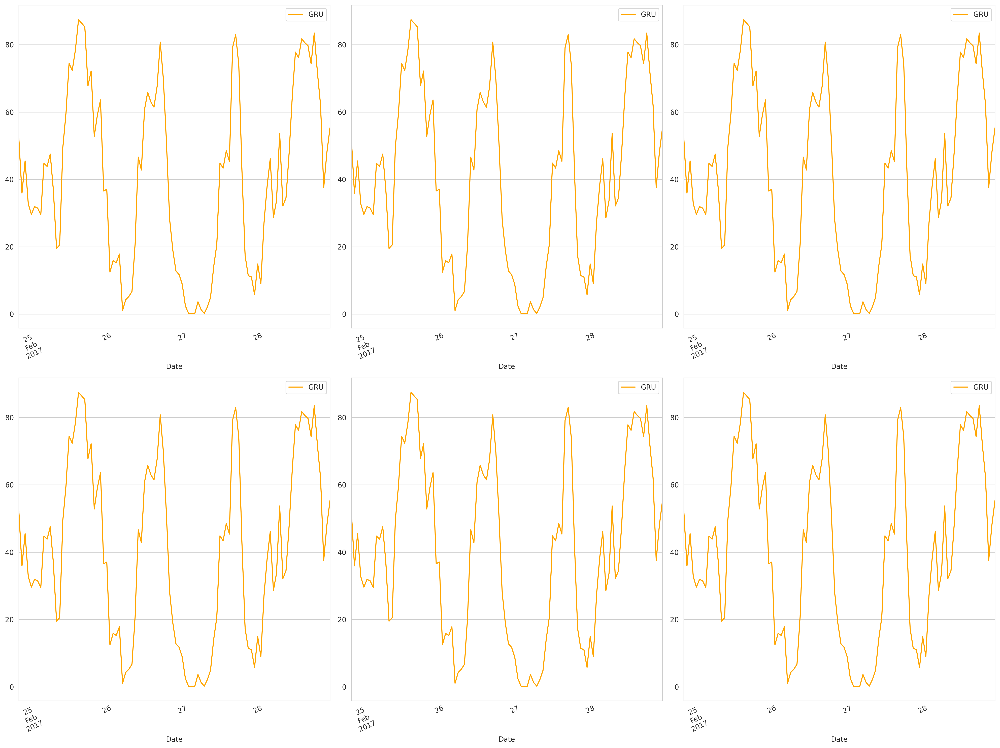

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    ax = y2[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='GRU'
    )
    ax.legend()
plt.tight_layout()


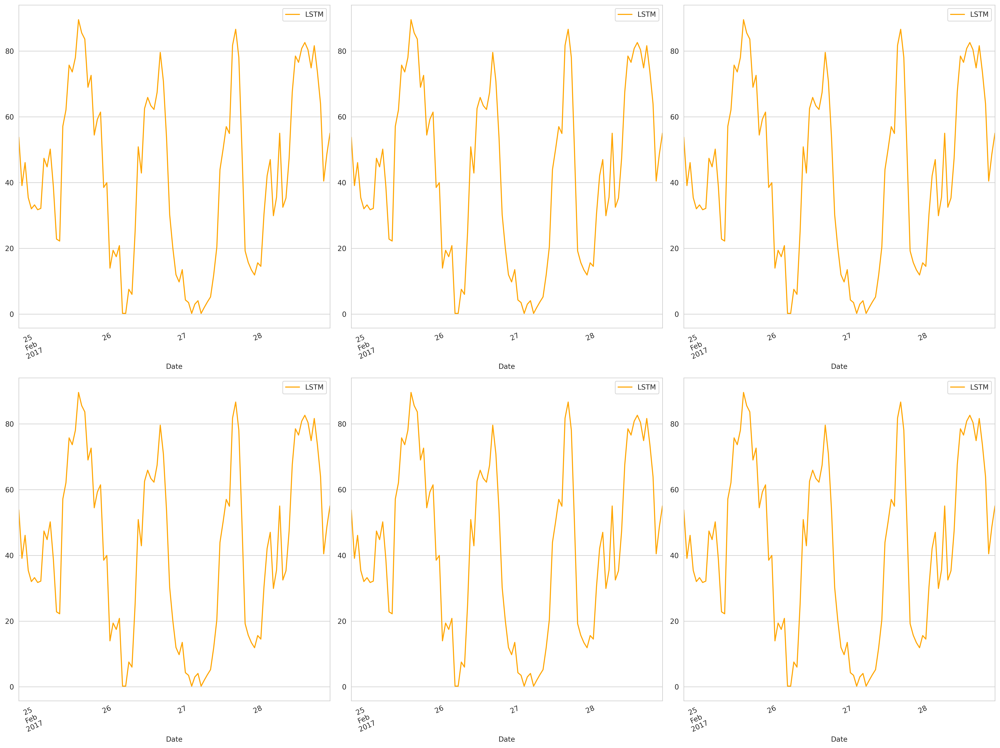

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    ax = y3[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='LSTM'
    )
    ax.legend()
plt.tight_layout()


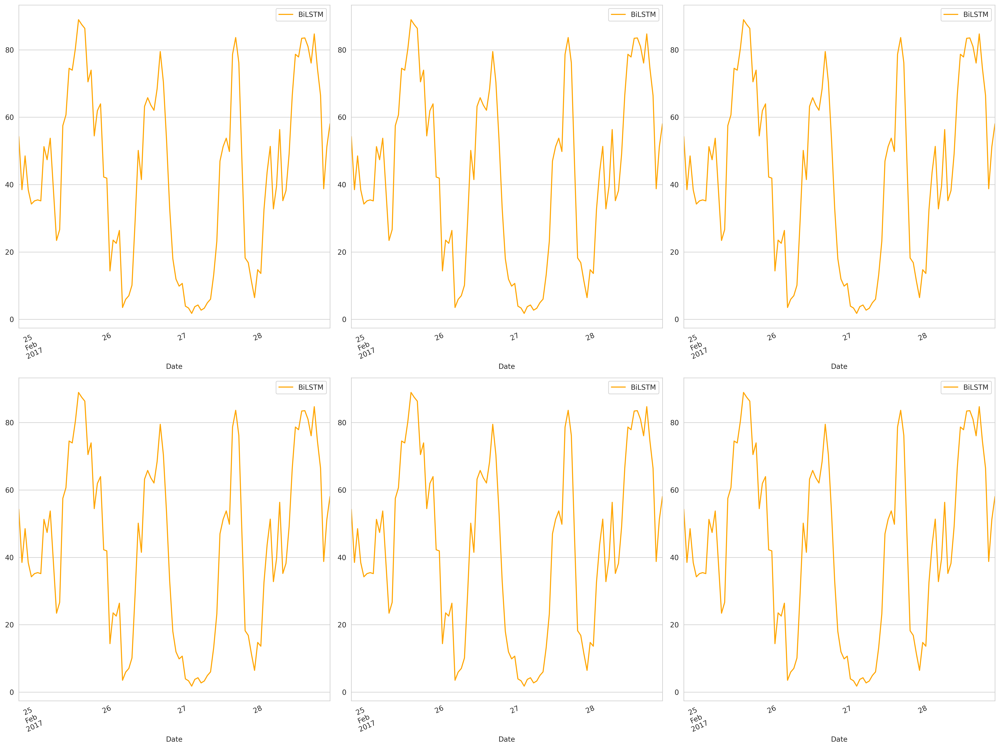

In [ ]:
fig, axes = plt.subplots(
    nrows=2, ncols=3, figsize=(20, 15), dpi=300, facecolor="w", edgecolor="k"
)
for i in range(len(feature_keys)-5):
    ax = y4[key].plot(
        ax=axes[i // 3, i % 3],
        color='orange',
        rot=25,
        label='BiLSTM'
    )
    ax.legend()
plt.tight_layout()


In [ ]:
print(y1)

                         PM2.5       PM10       SO2        NO2          CO  \
Date                                                                         
2017-02-24 20:00:00  22.680325  30.276976  6.294401  32.220310  468.377319   
2017-02-24 21:00:00  20.190632  29.805649  6.933890  42.529293  559.520325   
2017-02-24 22:00:00  13.837132  18.792444  4.386404  35.655224  444.333435   
2017-02-24 23:00:00  13.855762  20.591162  5.635176  42.363247  575.428284   
2017-02-25 00:00:00  17.036484  23.172070  6.582875  47.682003  594.429138   
2017-02-25 01:00:00  15.614858  20.962503  7.950167  46.759209  658.291321   
2017-02-25 02:00:00  12.094402  19.276302  7.751847  44.792717  647.599548   
2017-02-25 03:00:00   9.858509  11.919460  5.587743  45.051918  683.514893   
2017-02-25 04:00:00   7.482077   8.729333  3.013935  30.649439  475.531006   
2017-02-25 05:00:00   7.818671   8.430610  2.992400  32.093624  407.886139   
2017-02-25 06:00:00   9.643764  13.062176  3.205869  26.635267  

In [ ]:
print(y2)

                         PM2.5       PM10       SO2        NO2          CO  \
Date                                                                         
2017-02-24 20:00:00  20.944498  30.128365  5.617265  31.097649  466.724548   
2017-02-24 21:00:00  21.684851  36.068130  6.217072  48.875507  605.534729   
2017-02-24 22:00:00  13.975654  21.011511  2.973369  35.149899  422.408478   
2017-02-24 23:00:00  13.904989  23.846777  4.842538  44.493843  568.141541   
2017-02-25 00:00:00  15.231024  23.278126  5.781268  46.772320  591.378418   
2017-02-25 01:00:00  15.735631  24.770153  8.734406  48.477310  663.911438   
2017-02-25 02:00:00  12.480584  24.534361  7.744476  46.997227  664.202820   
2017-02-25 03:00:00   9.262496  13.563603  4.186755  46.265854  664.777954   
2017-02-25 04:00:00   7.168894  14.883946  2.351966  29.442606  489.813171   
2017-02-25 05:00:00   6.237436   9.721057  2.862498  31.826622  407.575439   
2017-02-25 06:00:00   9.423243  14.350621  2.455477  27.004414  

In [ ]:
print(y3)

                         PM2.5       PM10       SO2        NO2          CO  \
Date                                                                         
2017-02-24 20:00:00  18.641342  27.790287  4.924492  30.248842  410.892792   
2017-02-24 21:00:00  19.150797  29.237474  5.653134  45.661930  544.701660   
2017-02-24 22:00:00  12.360930  16.509880  2.936181  36.041920  382.435944   
2017-02-24 23:00:00  12.975533  20.765636  4.669031  43.430122  518.346130   
2017-02-25 00:00:00  14.738697  18.776663  5.547655  45.667904  554.789734   
2017-02-25 01:00:00  14.500402  17.049952  7.913116  49.584915  627.987061   
2017-02-25 02:00:00  10.858464  18.343996  7.084916  47.991714  608.524780   
2017-02-25 03:00:00  10.000209  11.702503  4.410353  46.603386  618.029846   
2017-02-25 04:00:00   7.624256  10.072742  2.862413  29.046209  434.549438   
2017-02-25 05:00:00   6.071665   8.631266  2.699190  31.652702  353.799316   
2017-02-25 06:00:00   8.716403  10.722461  2.961884  25.654963  

In [ ]:
print(y4)

                         PM2.5       PM10       SO2        NO2          CO  \
Date                                                                         
2017-02-24 20:00:00  23.313763  28.777496  5.343923  31.836294  461.966827   
2017-02-24 21:00:00  22.672815  30.628099  5.801180  48.480434  588.446045   
2017-02-24 22:00:00  11.472052  14.998094  3.512516  36.193958  405.499573   
2017-02-24 23:00:00  11.748080  16.320518  4.746841  43.557053  541.489380   
2017-02-25 00:00:00  13.947883  15.945090  5.877374  46.276985  563.331421   
2017-02-25 01:00:00  15.057352  18.337933  7.279560  50.629608  649.269775   
2017-02-25 02:00:00  10.881745  17.054703  6.521789  47.730179  628.016174   
2017-02-25 03:00:00   8.040405  10.386644  5.104500  46.672535  628.266785   
2017-02-25 04:00:00   3.846348   3.790903  2.532717  29.116899  434.361023   
2017-02-25 05:00:00   3.228211   2.209302  2.608343  31.441132  371.483734   
2017-02-25 06:00:00   6.103197   5.755159  2.542882  25.055847  

In [ ]:
def calculate_aqi(co, no2, pm25, pm10, so2, o3):
    # Define the AQI breakpoints and corresponding AQI values for each pollutant
    # You need to replace these values with the breakpoints specific to your region
    breakpoints = {
        'CO': [(0, 50), (51, 100), (101, 150), (151, 200), (201, 300), (301, 400)],
        'NO2': [(0, 50), (51, 100), (101, 150), (151, 200), (201, 300), (301, 400)],
        'PM25': [(0, 12), (12.1, 35.4), (35.5, 55.4), (55.5, 150.4), (150.5, 250.4), (250.5, 350.4)],
        'PM10': [(0, 54), (55, 154), (155, 254), (255, 354), (355, 424), (425, 504)],
        'SO2': [(0, 50), (51, 100), (101, 200), (201, 300), (301, 400), (401, 500)],
        'O3': [(0, 50), (51, 100), (101, 150), (151, 200), (201, 300), (301, 400)],
    }

    # Calculate AQI for each pollutant
    aqi_values = {}

    for pollutant, value in [('CO', co), ('NO2', no2), ('PM25', pm25), ('PM10', pm10), ('SO2', so2), ('O3', o3)]:
        for low, high in breakpoints[pollutant]:
            if low <= value <= high:
                I_LO, I_HI, BP_LO, BP_HI = breakpoints[pollutant].index((low, high)), breakpoints[pollutant].index(
                    (low, high)) + 1, low, high
                break

        AQI = ((I_HI - I_LO) / (BP_HI - BP_LO)) * (value - BP_LO) + I_LO
        aqi_values[pollutant] = AQI

    # Determine the overall AQI by selecting the highest individual AQI value
    overall_aqi = max(aqi_values.values())

    return overall_aqi


# Example usage:
co_value =sum(y2['CO']) / len(y2['CO'])
  # Replace with your CO value
no2_value = sum(y2['NO2']) / len(y2['NO2']) # Replace with your NO2 value
pm25_value = sum(y2['PM2.5']) / len(y2['PM2.5']) # Replace with your PM2.5 value
pm10_value = sum(y2['PM10']) / len(y2['PM10']) # Replace with your PM10 value
so2_value = sum(y2['SO2']) / len(y2['SO2'])# Replace with your SO2 value
o3_value = sum(y2['O3']) / len(y2['O3']) # Replace with your O3 value

aqi = calculate_aqi(co_value, no2_value, pm25_value, pm10_value, so2_value, o3_value)
print(f"Overall AQI: {aqi}")


UnboundLocalError: ignored